In [0]:
# Setup
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"

In [2]:
!git clone https://github.com/ucsd-dsc-arts/dsc160-final-dsc160-final-group14.git

Cloning into 'dsc160-final-dsc160-final-group14'...
remote: Enumerating objects: 21, done.
remote: Counting objects: 100% (21/21), done.
remote: Compressing objects: 100% (21/21), done.
remote: Total 210 (delta 12), reused 0 (delta 0), pack-reused 189
Receiving objects: 100% (210/210), 63.80 MiB | 27.73 MiB/s, done.
Resolving deltas: 100% (49/49), done.


In [3]:
!pip install unidecode
!pip install tensorflow==1.13.1

     |████████████████████████████████| 245kB 8.9MB/s 
     |████████████████████████████████| 92.5MB 38kB/s 
     |████████████████████████████████| 3.2MB 52.2MB/s 
     |████████████████████████████████| 368kB 55.4MB/s 
  Found existing installation: tensorboard 2.2.2
    Uninstalling tensorboard-2.2.2:
      Successfully uninstalled tensorboard-2.2.2
  Found existing installation: tensorflow-estimator 2.2.0
    Uninstalling tensorflow-estimator-2.2.0:
      Successfully uninstalled tensorflow-estimator-2.2.0
  Found existing installation: tensorflow 2.2.0
    Uninstalling tensorflow-2.2.0:
      Successfully uninstalled tensorflow-2.2.0


In [4]:
cd /content/dsc160-final-dsc160-final-group14/mellotron

/content/dsc160-final-dsc160-final-group14/mellotron


In [5]:
!git clone https://github.com/NVIDIA/waveglow.git

Cloning into 'waveglow'...
remote: Enumerating objects: 3, done.
remote: Counting objects: 100% (3/3), done.
remote: Compressing objects: 100% (3/3), done.
remote: Total 185 (delta 0), reused 1 (delta 0), pack-reused 182
Receiving objects: 100% (185/185), 435.86 KiB | 1.26 MiB/s, done.
Resolving deltas: 100% (102/102), done.


In [6]:
%matplotlib inline
import matplotlib
import matplotlib.pyplot as plt
import IPython.display as ipd

import sys
sys.path.append('waveglow/')

from itertools import cycle
import numpy as np
import scipy as sp
from scipy.io.wavfile import write
import pandas as pd
import librosa
import torch

from hparams import create_hparams
from model import Tacotron2, load_model
from waveglow.denoiser import Denoiser
from layers import TacotronSTFT
from data_utils import TextMelLoader, TextMelCollate
from text import cmudict, text_to_sequence
from mellotron_utils import get_data_from_musicxml

/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:528: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/usr/local/lib/python3.6/dist-packages/tensorflow/python/framework/dtypes.py:529: FutureWarning: Passing (type, 1) or 

In [0]:
def panner(signal, angle):
    angle = np.radians(angle)
    left = np.sqrt(2)/2.0 * (np.cos(angle) - np.sin(angle)) * signal
    right = np.sqrt(2)/2.0 * (np.cos(angle) + np.sin(angle)) * signal
    return np.dstack((left, right))[0]

In [0]:
def plot_mel_f0_alignment(mel_source, mel_outputs_postnet, f0s, alignments, figsize=(16, 16)):
    fig, axes = plt.subplots(4, 1, figsize=figsize)
    axes = axes.flatten()
    axes[0].imshow(mel_source, aspect='auto', origin='bottom', interpolation='none')
    axes[1].imshow(mel_outputs_postnet, aspect='auto', origin='bottom', interpolation='none')
    axes[2].scatter(range(len(f0s)), f0s, alpha=0.5, color='red', marker='.', s=1)
    axes[2].set_xlim(0, len(f0s))
    axes[3].imshow(alignments, aspect='auto', origin='bottom', interpolation='none')
    axes[0].set_title("Source Mel")
    axes[1].set_title("Predicted Mel")
    axes[2].set_title("Source pitch contour")
    axes[3].set_title("Source rhythm")
    plt.tight_layout()

In [0]:
def load_mel(path):
    audio, sampling_rate = librosa.core.load(path, sr=hparams.sampling_rate)
    audio = torch.from_numpy(audio)
    if sampling_rate != hparams.sampling_rate:
        raise ValueError("{} SR doesn't match target {} SR".format(
            sampling_rate, stft.sampling_rate))
    audio_norm = audio.unsqueeze(0)
    audio_norm = torch.autograd.Variable(audio_norm, requires_grad=False)
    melspec = stft.mel_spectrogram(audio_norm)
    melspec = melspec.cuda()
    return melspec

In [10]:
hparams = create_hparams()


For more information, please see:
  * https://github.com/tensorflow/community/blob/master/rfcs/20180907-contrib-sunset.md
  * https://github.com/tensorflow/addons
If you depend on functionality not listed there, please file an issue.



In [0]:
stft = TacotronSTFT(hparams.filter_length, hparams.hop_length, hparams.win_length,
                    hparams.n_mel_channels, hparams.sampling_rate, hparams.mel_fmin,
                    hparams.mel_fmax)

In [12]:
hparams

HParams([('attention_dim', 128), ('attention_location_kernel_size', 31), ('attention_location_n_filters', 32), ('attention_rnn_dim', 1024), ('batch_size', 32), ('cmudict_path', 'data/cmu_dictionary'), ('cudnn_benchmark', False), ('cudnn_enabled', True), ('decoder_rnn_dim', 1024), ('dist_backend', 'nccl'), ('dist_url', 'tcp://localhost:54321'), ('distributed_run', False), ('dynamic_loss_scaling', True), ('encoder_embedding_dim', 512), ('encoder_kernel_size', 5), ('encoder_n_convolutions', 3), ('epochs', 50000), ('f0_max', 880), ('f0_min', 80), ('filter_length', 1024), ('fp16_run', False), ('gate_threshold', 0.5), ('grad_clip_thresh', 1.0), ('harm_thresh', 0.25), ('hop_length', 256), ('ignore_layers', ['speaker_embedding.weight']), ('iters_per_checkpoint', 500), ('learning_rate', 0.001), ('learning_rate_anneal', 50000), ('learning_rate_min', 1e-05), ('mask_padding', True), ('max_decoder_steps', 1000), ('max_wav_value', 32768.0), ('mel_fmax', 8000.0), ('mel_fmin', 0.0), ('n_frames_per_ste

## Loading Models:

We create a new folder called models within the mellotron folder and upload the mellotron_libritts model within that. Then we will assign that path the name checkpoint_path.

In [13]:
checkpoint_path = "models/mellotron_libritts.pt"
mellotron = load_model(hparams).cuda().eval()
mellotron.load_state_dict(torch.load(checkpoint_path)['state_dict'])

<All keys matched successfully>

In [14]:
waveglow = torch.hub.load('nvidia/DeepLearningExamples:torchhub', 'nvidia_waveglow').cuda()
denoiser = Denoiser(waveglow).cuda().eval()

Downloading: "https://github.com/nvidia/DeepLearningExamples/archive/torchhub.zip" to /root/.cache/torch/hub/torchhub.zip


We will now load our data and attempt to change the accent and/or gender of the speaker.

In [15]:
%%file data/examples_filelist.txt
# custom_data/final1.wav|So sudden and violent was the fit that the unfortunate prisoner was unable to complete the sentence; a violent convulsion shook his whole frame, his eyes stared from their sockets, his mouth was drawn on one side, his cheeks became purple, he struggled, foamed, dashed himself about, and uttered the most dreadful cries, which, however, Dantes prevented from being heard by covering his head with the blanket.|26
data/example1.wav|exploring the expanses of space to keep our planet safe|1
custom_data/russian6.wav|Please call Stella.  Ask her to bring these things with her from the store:  Six spoons of fresh snow peas, five thick slabs of blue cheese, and maybe a snack for her brother Bob.  We also need a small plastic snake and a big toy frog for the kids.  She can scoop these things into three red bags, and we will go meet her Wednesday at the train station.|0

Overwriting data/examples_filelist.txt


In [0]:
arpabet_dict = cmudict.CMUDict('data/cmu_dictionary')
audio_paths = 'data/examples_filelist.txt'
dataloader = TextMelLoader(audio_paths, hparams)
datacollate = TextMelCollate(1)

In [17]:
file_idx = 0
audio_path, text, sid = dataloader.audiopaths_and_text[file_idx]

# get audio path, encoded text, pitch contour and mel for gst
text_encoded = torch.LongTensor(text_to_sequence(text, hparams.text_cleaners, arpabet_dict))[None, :].cuda()    
pitch_contour = dataloader[file_idx][3][None].cuda()
mel = load_mel(audio_path)
print(audio_path, text)

# load source data to obtain rhythm using tacotron 2 as a forced aligner
x, y = mellotron.parse_batch(datacollate([dataloader[file_idx]]))

custom_data/russian6.wav Please call Stella.  Ask her to bring these things with her from the store:  Six spoons of fresh snow peas, five thick slabs of blue cheese, and maybe a snack for her brother Bob.  We also need a small plastic snake and a big toy frog for the kids.  She can scoop these things into three red bags, and we will go meet her Wednesday at the train station.


In [18]:
print("This is the original audio: ")
ipd.Audio(audio_path, rate=hparams.sampling_rate)

This is the original audio: 


In [0]:
speaker_ids = TextMelLoader("filelists/libritts_train_clean_100_audiopath_text_sid_shorterthan10s_atleast5min_train_filelist.txt", hparams).speaker_ids
speakers = pd.read_csv('filelists/libritts_speakerinfo.txt', engine='python',header=None, comment=';', sep=' *\| *', 
                       names=['ID', 'SEX', 'SUBSET', 'MINUTES', 'NAME'])
speakers['MELLOTRON_ID'] = speakers['ID'].apply(lambda x: speaker_ids[x] if x in speaker_ids else -1)
female_speakers = cycle(
    speakers.query("SEX == 'F' and MINUTES > 20 and MELLOTRON_ID >= 0")['MELLOTRON_ID'].sample(frac=1).tolist())
male_speakers = cycle(
    speakers.query("SEX == 'M' and MINUTES > 20 and MELLOTRON_ID >= 0")['MELLOTRON_ID'].sample(frac=1).tolist())

In [0]:
with torch.no_grad():
    # get rhythm (alignment map) using tacotron 2
    mel_outputs, mel_outputs_postnet, gate_outputs, rhythm = mellotron.forward(x)
    rhythm = rhythm.permute(1, 0, 2)

In [22]:
# Randomly choosing 4 as our Speaker
speakers[speakers['MELLOTRON_ID'] == 4]

,ID,SEX,SUBSET,MINUTES,NAME,MELLOTRON_ID
457,1246,F,train-clean-100,25.09,Sandra,4


Current_Speaker_Id is: 4


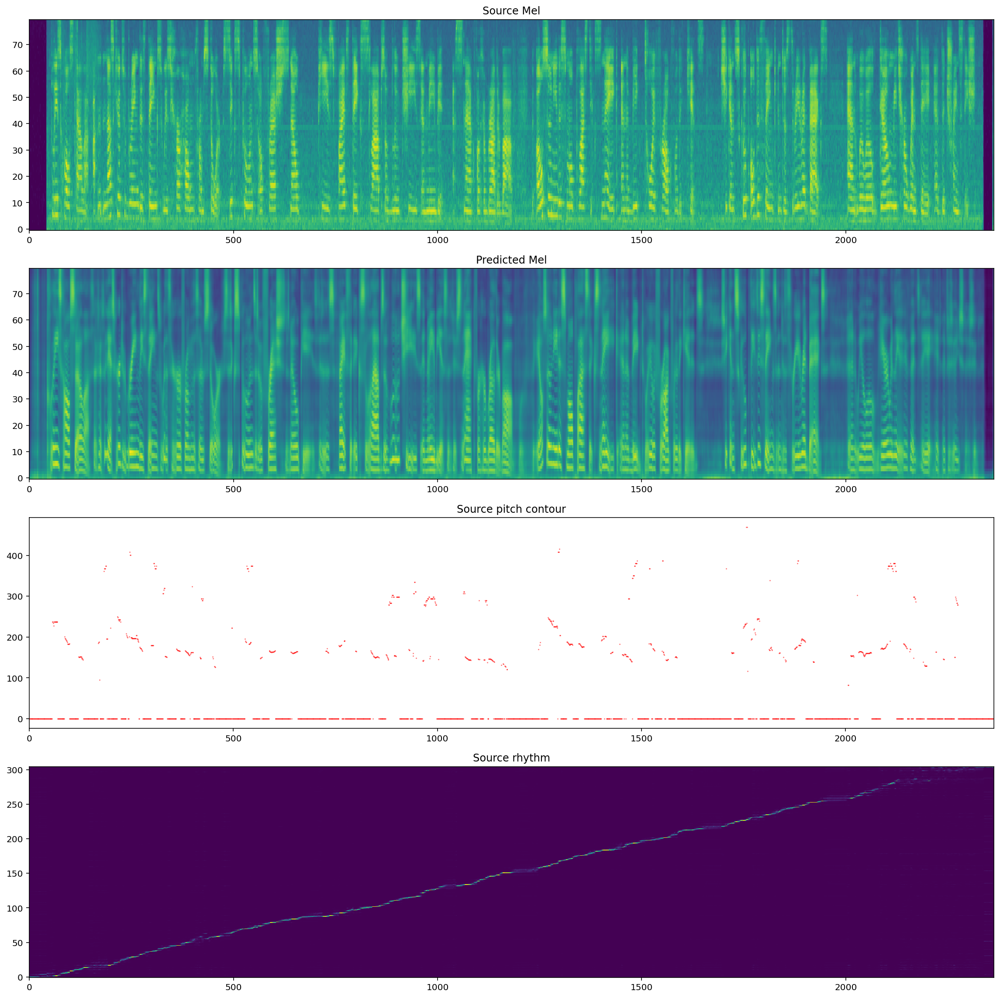

In [23]:
# Accent Conversion
speaker_id = next(female_speakers) if np.random.randint(2) else next(male_speakers)
speaker_id = 4
print(f'Current_Speaker_Id is: {speaker_id}')
ind = speaker_id
speaker_id = torch.LongTensor([speaker_id]).cuda()

with torch.no_grad():
    mel_outputs, mel_outputs_postnet, gate_outputs, _ = mellotron.inference_noattention(
        (text_encoded, mel, speaker_id, pitch_contour, rhythm))

plot_mel_f0_alignment(x[2].data.cpu().numpy()[0],
                      mel_outputs_postnet.data.cpu().numpy()[0],
                      pitch_contour.data.cpu().numpy()[0, 0],
                      rhythm.data.cpu().numpy()[:, 0].T)

In [24]:
with torch.no_grad():
    audio = denoiser(waveglow.infer(mel_outputs_postnet, sigma=0.8), 0.01)[:, 0]
print("This is the updated audio with a female speaker with a different accent: ")
ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate)

This is the updated audio: 


We will now attempt to try to have a male speaker.

In [33]:
speakers[(speakers['SEX'] == "M") & (speakers["MELLOTRON_ID"] != -1)].sort_values("MINUTES").tail(5)

,ID,SEX,SUBSET,MINUTES,NAME,MELLOTRON_ID
1828,6454,M,train-clean-100,25.22,David Wales,80
216,460,M,train-clean-100,25.23,Dave Ranson,53
2112,7447,M,train-clean-100,25.24,dasbury,99
99,196,M,train-clean-100,25.24,Stewart Wills,11
1066,3436,M,train-clean-100,25.25,Anders Lankford,31


Current_Speaker_Id is: 11


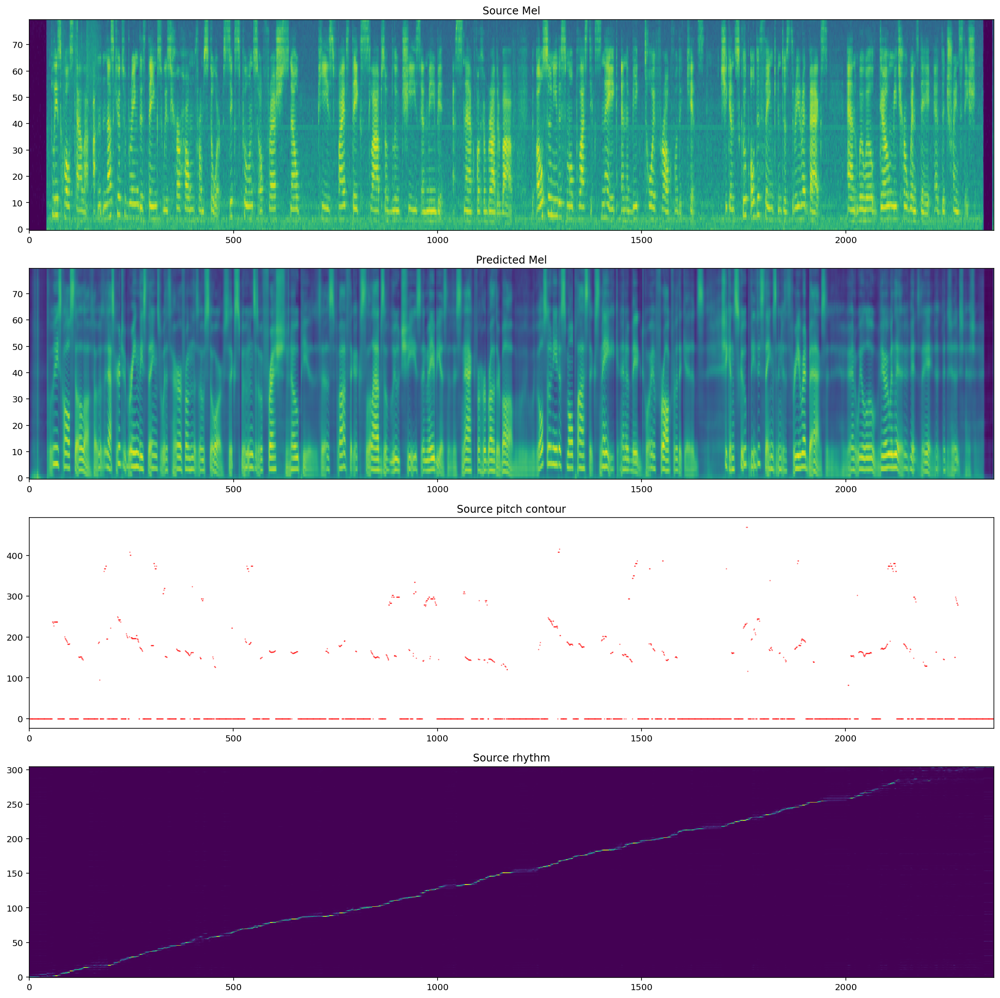

In [34]:
# Let us choose Stewart Wills
speaker_id = next(female_speakers) if np.random.randint(2) else next(male_speakers)
speaker_id = 11
print(f'Current_Speaker_Id is: {speaker_id}')
ind = speaker_id
speaker_id = torch.LongTensor([speaker_id]).cuda()

with torch.no_grad():
    mel_outputs, mel_outputs_postnet, gate_outputs, _ = mellotron.inference_noattention(
        (text_encoded, mel, speaker_id, pitch_contour, rhythm))

plot_mel_f0_alignment(x[2].data.cpu().numpy()[0],
                      mel_outputs_postnet.data.cpu().numpy()[0],
                      pitch_contour.data.cpu().numpy()[0, 0],
                      rhythm.data.cpu().numpy()[:, 0].T)

In [35]:
with torch.no_grad():
    audio = denoiser(waveglow.infer(mel_outputs_postnet, sigma=0.8), 0.01)[:, 0]
print("This is the updated audio with a male speaker: ")
ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate)

This is the updated audio with a male speaker: 


Current_Speaker_Id is: 31


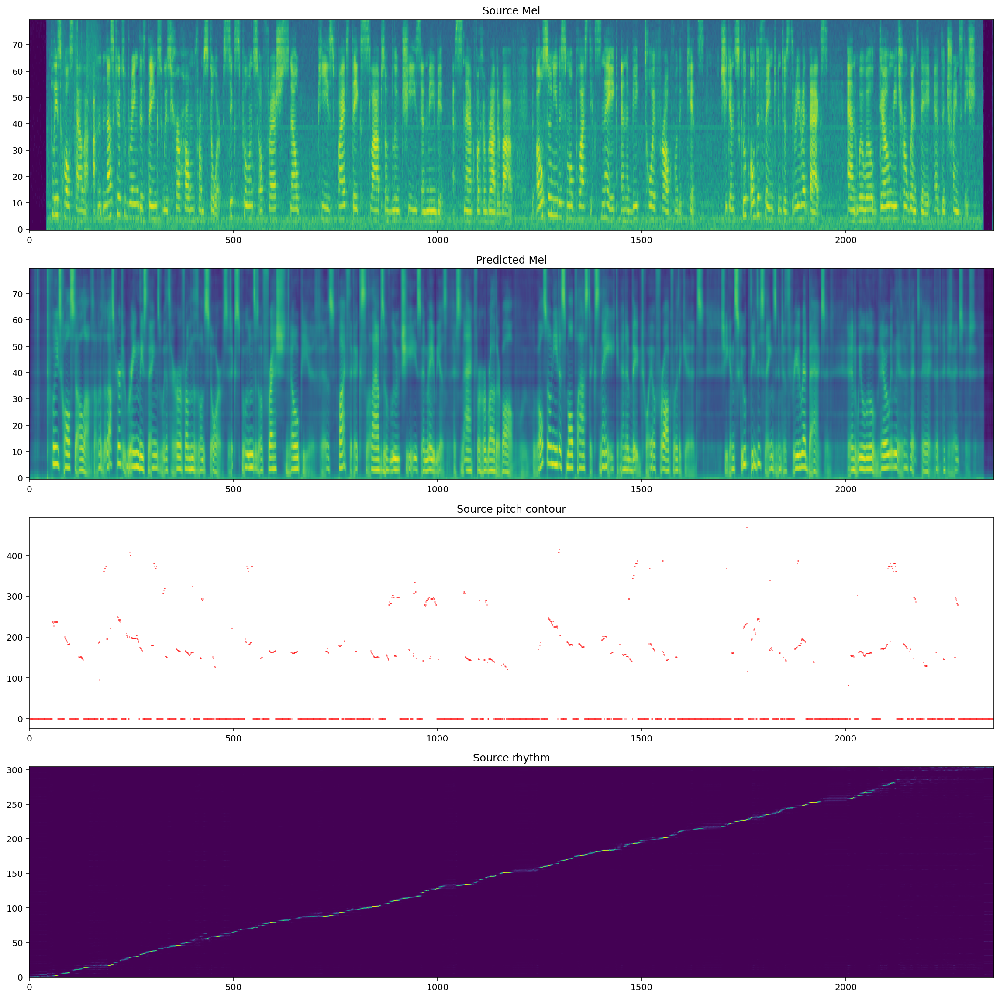

In [36]:
# Let us choose Stewart Wills
speaker_id = next(female_speakers) if np.random.randint(2) else next(male_speakers)
speaker_id = 31
print(f'Current_Speaker_Id is: {speaker_id}')
ind = speaker_id
speaker_id = torch.LongTensor([speaker_id]).cuda()

with torch.no_grad():
    mel_outputs, mel_outputs_postnet, gate_outputs, _ = mellotron.inference_noattention(
        (text_encoded, mel, speaker_id, pitch_contour, rhythm))

plot_mel_f0_alignment(x[2].data.cpu().numpy()[0],
                      mel_outputs_postnet.data.cpu().numpy()[0],
                      pitch_contour.data.cpu().numpy()[0, 0],
                      rhythm.data.cpu().numpy()[:, 0].T)

In [37]:
with torch.no_grad():
    audio = denoiser(waveglow.infer(mel_outputs_postnet, sigma=0.8), 0.01)[:, 0]
print("This is the updated audio with another male speaker: ")
ipd.Audio(audio[0].data.cpu().numpy(), rate=hparams.sampling_rate)

This is the updated audio with another male speaker: 


## Text To Speech

We will now use Tacotron2 and Waveglow to reimagine old, iconic quotes in new voices. In particular, we wish to transform famous political quotes to a new, female voice.

### Loading Model:

In [0]:
tacotron2 = torch.hub.load('nvidia/DeepLearningExamples:torchhub', 'nvidia_tacotron2')
tacotron2 = tacotron2.to('cuda')
tacotron2.eval()

In [0]:
text = "Those who make peaceful revolution impossible will make violent revolution inevitable."

In [0]:
# preprocessing
sequence = np.array(tacotron2.text_to_sequence(text, ['english_cleaners']))[None, :]
sequence = torch.from_numpy(sequence).to(device='cuda', dtype=torch.int64)

# run the models
with torch.no_grad():
    _, mel, _, _ = tacotron2.infer(sequence)
    audio = waveglow.infer(mel)
audio_numpy = audio[0].data.cpu().numpy()
rate = 22050

In [48]:
#write("audio.wav", rate, audio_numpy)
from IPython.display import Audio
Audio(audio_numpy, rate=rate)

In [0]:
# Let's try out another famous quote:
text = "Yesterday, December 7th, 1941 -- a date which will live in infamy -- the United States of America was suddenly and deliberately attacked by naval and air forces of the Empire of Japan. The United States was at peace with that nation and, at the solicitation of Japan, was still in conversation with its government and its emperor looking toward the maintenance of peace in the Pacific."

In [0]:
tacotron2.decoder.max_decoder_steps = 10000
tacotron2.decoder.gate_threshold = 0.01

In [0]:
# preprocessing
sequence = np.array(tacotron2.text_to_sequence(text, ['english_cleaners']))[None, :]
sequence = torch.from_numpy(sequence).to(device='cuda', dtype=torch.int64)

# run the models
with torch.no_grad():
    _, mel, _, _ = tacotron2.infer(sequence)
    audio = waveglow.infer(mel)
audio_numpy = audio[0].data.cpu().numpy()
rate = 22050

In [68]:
#write("audio.wav", rate, audio_numpy)
from IPython.display import Audio
Audio(audio_numpy, rate=rate)

There was some mispronunciation of certain words there, but overall considering thsi is only a pre-trained model the performance is pretty good.